In [9]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import nbformat
print(nbformat.__version__)  # Debe ser >= 4.2.0
import pandas as pd
import pyodbc
from datetime import datetime
from dotenv import load_dotenv
import os
# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import plotly.express as px
plt.style.use('fivethirtyeight')
plt.rcParams['lines.linewidth'] = 1.5
%matplotlib inline

# Modelado y Forecasting
# ==============================================================================
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline

from skforecast.ForecasterAutoreg import ForecasterAutoreg
# from skforecast.ForecasterAutoregMultiOutput import ForecasterAutoregMultiOutput
from skforecast.model_selection import backtesting_forecaster, grid_search_forecaster

from joblib import dump, load

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')
%config Completer.use_jedi = False

5.10.4


In [11]:
import pyodbc
import pandas as pd
from datetime import datetime

# 1. Obtener cadena de conexión sin usar os ni dotenv
def get_connection_string(server: str, database: str, username: str, password: str, driver: str = '{ODBC Driver 17 for SQL Server}'):
    return f'DRIVER={driver};SERVER={server};DATABASE={database};UID={username};PWD={password};'


# 2. Cargar datos de una tabla a DataFrame
def get_blob_to_df(table_name: str, connection_str: str):
    try:
        with pyodbc.connect(connection_str, autocommit=True) as conn:
            query = f"SELECT * FROM {table_name};"
            df = pd.read_sql(query, conn)
        return True, df
    except Exception as e:
        return False, str(e)


# 3. Guardar resultados con fecha de ejecución
def guardar_resultados(datos: pd.DataFrame, modelo: str):
    fecha_ejecucion = datetime.now()
    resultados = pd.DataFrame({
        'DATE_TIME': datos.index,
        'PREDICCION': datos['pred'],
        'MODELO': modelo,
        'EXECUTION_DATE': fecha_ejecucion
    })
    return resultados


# 4. Guardar pronóstico sin fecha de ejecución
def guardar_pronostico(datos: pd.DataFrame, modelo: str):
    resultados = pd.DataFrame({
        'DATE_TIME': datos.index,
        'PREDICCION': datos['pred'],
        'MODELO': modelo
    })
    return resultados


# 5. Subir DataFrame a SQL Server (sin optimización por lotes)
def upload_df_to_blob(df: pd.DataFrame, table_name: str, connection_str: str):
    try:
        df = df.where(pd.notnull(df), None)
        with pyodbc.connect(connection_str, autocommit=True) as conn:
            cursor = conn.cursor()
            columns = ','.join(df.columns)
            placeholders = ','.join(['?'] * len(df.columns))
            cmd_insert = f"INSERT INTO {table_name} ({columns}) VALUES ({placeholders})"
            cursor.fast_executemany = True
            cursor.executemany(cmd_insert, df.values.tolist())
        return True, ""
    except Exception as e:
        return False, str(e)


# 6. Subir DataFrame a SQL Server en lotes (mejor rendimiento)
def upload_df_to_blob_with_steroids(df: pd.DataFrame, table_name: str, connection_str: str, batch_size: int = 5000):
    try:
        df = df.where(pd.notnull(df), None)
        with pyodbc.connect(connection_str, autocommit=False) as conn:
            cursor = conn.cursor()
            columns = ','.join(df.columns)
            placeholders = ','.join(['?'] * len(df.columns))
            cmd_insert = f"INSERT INTO {table_name} ({columns}) VALUES ({placeholders})"
            cursor.fast_executemany = True

            for start in range(0, len(df), batch_size):
                end = start + batch_size
                batch = df.iloc[start:end].values.tolist()
                cursor.executemany(cmd_insert, batch)
                conn.commit()

        return True, ""
    except Exception as e:
        return False, str(e)


# 7. Crear tabla SQL
def crear_tabla_sql(connection_str: str, sql_create: str):
    try:
        with pyodbc.connect(connection_str, autocommit=True) as conn:
            cursor = conn.cursor()
            cursor.execute(sql_create)
        print("Tabla creada correctamente.")
    except Exception as e:
        print(f"Error al crear la tabla: {e}")

In [128]:
# Configura la conexión de base de datos SQL Server
cnn = get_connection_string('LAPTOP-9JDBI17R', 'master', 'sa', 'm@rk3t2o15')
# Query SQL para extraer datos
_, datos = get_blob_to_df(table_name = 'MD_FLUJO_VEHICULAR', connection_str = cnn)

In [130]:
# Eliminar la parte de la hora si existe
datos['fecha'] = datos['fecha'].str.extract(r'^(\d{2}/\d{2}/\d{4})')[0]

# Convertir las fechas a formato Y-M-D como texto
datos['fecha'] = pd.to_datetime(datos['fecha'], dayfirst=True).dt.strftime('%Y-%m-%d')
datos['fecha'] = pd.to_datetime(datos['fecha'])

In [132]:
datos['fecha']

0         2017-01-01
1         2017-01-01
2         2017-01-01
3         2017-01-01
4         2017-01-01
             ...    
1048570   2020-12-29
1048571   2020-12-29
1048572   2020-12-29
1048573   2020-12-29
1048574   2020-12-29
Name: fecha, Length: 1048575, dtype: datetime64[ns]

**Descripción del conjunto de datos de flujo vehicular**

Este conjunto de datos recoge información sobre el tránsito vehicular registrado en distintas estaciones de monitoreo a 
partir del año 2017, en una ciudad específica. Los datos reflejan el volumen de vehículos que circularon por cada estación, desglosado por tipo de vehículo, método de pago y dirección del flujo. Esta información es clave para estudiar patrones de movilidad urbana y apoyar decisiones en la gestión del transporte.

El dataset resultante contiene las siguientes columnas:

| **Columna**        | **Descripción**                                              |
|--------------------|--------------------------------------------------------------|
| `periodo`          | Año al que pertenece cada registro.                                 |
| `fecha`            | Fecha de la medición (formato día/mes/año).                             |
| `hora_inicio`      | Hora exacta en que comienza el conteo.                             |
| `estacion`         | nombre de la estación donde se realizó el conteo vehicular                  |
| `sentido`          | Sentido del flujo vehicular (por ejemplo, "Centro").       |
| `tipo_vehiculo`    | Clasificación del vehículo (Liviano, Pesado, etc.).          |
| `forma_pago`       | Medio de pago utilizado (efectivo, telepase, no cobrado).    |
| `cantidad_pasos`   | Total de vehículos contabilizados en ese periodo. |

Este dataset es especialmente útil para analizar la dinámica del tránsito en distintos puntos de la ciudad, evaluar el uso de medios de pago y planificar mejoras en infraestructura vial o sistemas de control de tráfico.

In [134]:
#encontrar fecha minima y maxima
fecha_min = datos['fecha'].min()
fecha_max = datos['fecha'].max()
print(f"Fecha mínima: {fecha_min}")
print(f"Fecha máxima: {fecha_max}")

# Crea un dataframe que contenga las fechas desde la fecha mínima hasta la fecha máxima
df_fechas = pd.date_range(start=fecha_min, end=fecha_max, freq='D')

# En df_fechas agregar las columnas
df_fechas = pd.DataFrame(df_fechas, columns=['FECHA'])
df_fechas['id_fecha'] = df_fechas['FECHA'].dt.strftime('%Y%m%d')
df_fechas['DIA_SEMANA'] = df_fechas['FECHA'].dt.dayofweek
df_fechas['NOMBRE_DIA_SEMANA'] = df_fechas['FECHA'].dt.day_name()
df_fechas['DIA_MES'] = df_fechas['FECHA'].dt.day
df_fechas['DIA_ANIO'] = df_fechas['FECHA'].dt.dayofyear
df_fechas['NOMBRE_MES'] = df_fechas['FECHA'].dt.month_name()
df_fechas['MES_ANIO'] = df_fechas['FECHA'].dt.month
df_fechas['SEMANA_ANIO'] = df_fechas['FECHA'].dt.isocalendar().week
df_fechas['ANIO'] = df_fechas['FECHA'].dt.year
# ADICIONAL
df_fechas['BIMESTRE'] = ((df_fechas['FECHA'].dt.month - 1) // 2) + 1
df_fechas['TRIMESTRE'] = ((df_fechas['FECHA'].dt.month - 1) // 3) + 1
df_fechas['SEMESTRE'] = ((df_fechas['FECHA'].dt.month - 1) // 6) + 1
# FERIADOS
import holidays
pe = holidays.PE()
df_fechas['FERIADO'] = df_fechas['FECHA'].apply(lambda x: 1 if x in pe else 0)

# Intercambiar el orden de las 2 primeras columnas de df_fechas
df_fechas = df_fechas[['id_fecha', 'FECHA'] + [col for col in df_fechas.columns if col not in ['id_fecha', 'FECHA']]]
df_fechas



Fecha mínima: 2017-01-01 00:00:00
Fecha máxima: 2020-12-31 00:00:00


,id_fecha,FECHA,DIA_SEMANA,NOMBRE_DIA_SEMANA,DIA_MES,DIA_ANIO,NOMBRE_MES,MES_ANIO,SEMANA_ANIO,ANIO,BIMESTRE,TRIMESTRE,SEMESTRE,FERIADO
0,20170101,2017-01-01,6,Sunday,1,1,January,1,52,2017,1,1,1,1
1,20170102,2017-01-02,0,Monday,2,2,January,1,1,2017,1,1,1,0
2,20170103,2017-01-03,1,Tuesday,3,3,January,1,1,2017,1,1,1,0
3,20170104,2017-01-04,2,Wednesday,4,4,January,1,1,2017,1,1,1,0
4,20170105,2017-01-05,3,Thursday,5,5,January,1,1,2017,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,20201227,2020-12-27,6,Sunday,27,362,December,12,52,2020,6,4,2,0
1457,20201228,2020-12-28,0,Monday,28,363,December,12,53,2020,6,4,2,0
1458,20201229,2020-12-29,1,Tuesday,29,364,December,12,53,2020,6,4,2,0
1459,20201230,2020-12-30,2,Wednesday,30,365,December,12,53,2020,6,4,2,0


In [136]:

sql_create_tiempo = """
IF NOT EXISTS (SELECT * FROM sysobjects WHERE name='dim_tiempo' AND xtype='U')
BEGIN
    CREATE TABLE dbo.dim_tiempo (
        id_fecha VARCHAR(8) PRIMARY KEY,
        FECHA DATE,
        DIA_SEMANA INT,
        NOMBRE_DIA_SEMANA VARCHAR(20),
        DIA_MES INT,
        DIA_ANIO INT,
        NOMBRE_MES VARCHAR(20),
        MES_ANIO INT,
        SEMANA_ANIO INT,
        ANIO INT,
        BIMESTRE INT,
        TRIMESTRE INT,
        SEMESTRE INT,
        FERIADO BIT
    )
END
"""
crear_tabla_sql(cnn, sql_create_tiempo)

Tabla creada correctamente.


In [138]:
response, msg = upload_df_to_blob(df=df_fechas, table_name = 'dbo.dim_tiempo', connection_str = cnn)
print(f"Response: {response}, Message: {msg}")

Response: False, Message: ('23000', "[23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_tiem__E9FBC1BFE3416A20'. Cannot insert duplicate key in object 'dbo.dim_tiempo'. The duplicate key value is (20170101). (2627) (SQLExecute); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_tiem__E9FBC1BFE3416A20'. Cannot insert duplicate key in object 'dbo.dim_tiempo'. The duplicate key value is (20170102). (2627); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_tiem__E9FBC1BFE3416A20'. Cannot insert duplicate key in object 'dbo.dim_tiempo'. The duplicate key value is (20170103). (2627); [23000] [Microsoft][ODBC Driver 17 

In [139]:
# DataFrame con las columnas id_hora (incremental desde 1), HORA (de 0 a 23 tipo Time), PERIDO (AM/PM) y HORA_INT (de 0 a 23)
df_horas = pd.DataFrame({
    'id_hora': range(1, 25),
    'HORA': pd.date_range('00:00', '23:00', freq='H').time,
    'PERIODO': ['AM'] * 12 + ['PM'] * 12,
    'HORA_INT': list(range(0, 24))
})
df_horas.head(30)


,id_hora,HORA,PERIODO,HORA_INT
0,1,00:00:00,AM,0
1,2,01:00:00,AM,1
2,3,02:00:00,AM,2
3,4,03:00:00,AM,3
4,5,04:00:00,AM,4
5,6,05:00:00,AM,5
6,7,06:00:00,AM,6
7,8,07:00:00,AM,7
8,9,08:00:00,AM,8
9,10,09:00:00,AM,9


In [142]:
sql_create_hora = """
IF NOT EXISTS (SELECT * FROM sysobjects WHERE name='dim_hora' AND xtype='U')
BEGIN
    CREATE TABLE dbo.dim_hora (
        id_hora INT PRIMARY KEY,
        HORA TIME,
        PERIODO VARCHAR(2),
        HORA_INT INT
    )
END
"""
crear_tabla_sql(cnn, sql_create_hora)

Tabla creada correctamente.


In [144]:
response, msg = upload_df_to_blob(df=df_horas, table_name = 'dbo.dim_hora', connection_str = cnn)
print(f"Response: {response}, Message: {msg}")

Response: False, Message: ('23000', "[23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_hora__BE4B3D73B066D682'. Cannot insert duplicate key in object 'dbo.dim_hora'. The duplicate key value is (1). (2627) (SQLExecute); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_hora__BE4B3D73B066D682'. Cannot insert duplicate key in object 'dbo.dim_hora'. The duplicate key value is (2). (2627); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_hora__BE4B3D73B066D682'. Cannot insert duplicate key in object 'dbo.dim_hora'. The duplicate key value is (3). (2627); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]

In [146]:
#Dataframe df_sentido con las columnas id_sentido (incremental desde 1), SENTIDO (valores unicos de la columna 'sentido' del dataframe 'datos')
df_sentido = pd.DataFrame({
    'id_sentido': range(1, len(datos['sentido'].unique()) + 1),
    'SENTIDO': datos['sentido'].unique()
})
df_sentido.head() 

,id_sentido,SENTIDO
0,1,Centro
1,2,Provincia


In [148]:
sql_create_sentido = """
IF NOT EXISTS (SELECT * FROM sysobjects WHERE name='dim_sentido' AND xtype='U')
BEGIN
    CREATE TABLE dbo.dim_sentido (
        id_sentido INT PRIMARY KEY,
        SENTIDO VARCHAR(50)
    )
END
"""
crear_tabla_sql(cnn, sql_create_sentido)

Tabla creada correctamente.


In [150]:
response, msg = upload_df_to_blob(df=df_sentido, table_name = 'dbo.dim_sentido', connection_str = cnn)
print(f"Response: {response}, Message: {msg}")

Response: False, Message: ('23000', "[23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_sent__A80781857C2AA0CC'. Cannot insert duplicate key in object 'dbo.dim_sentido'. The duplicate key value is (1). (2627) (SQLExecute); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_sent__A80781857C2AA0CC'. Cannot insert duplicate key in object 'dbo.dim_sentido'. The duplicate key value is (2). (2627); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621)")


In [152]:
#Dataframe df_tipo_vehiculo con las columnas id_tipo_vehiculo (incremental desde 1), TIPO_VEHICULO (valores unicos de la columna 'tipo_vehiculo' del dataframe 'datos')
df_tipo_vehiculo = pd.DataFrame({
    'id_tipo_vehiculo': range(1, len(datos['tipo_vehiculo'].unique()) + 1),
    'TIPO_VEHICULO': datos['tipo_vehiculo'].unique()
})
df_tipo_vehiculo.head(20)

,id_tipo_vehiculo,TIPO_VEHICULO
0,1,Liviano
1,2,Pesado
2,3,Auto
3,4,Auto con trailer
4,5,Moto
5,6,N/D
6,7,Pago Doble Auto
7,8,Pesados 2 Ejes
8,9,Pesados 3 Ejes
9,10,Pesados 4 Ejes


In [154]:
sql_create_tipo_vehiculo = """
IF NOT EXISTS (SELECT * FROM sysobjects WHERE name='dim_tipo_vehiculo' AND xtype='U')
BEGIN
    CREATE TABLE dbo.dim_tipo_vehiculo (
        id_tipo_vehiculo INT PRIMARY KEY,
        TIPO_VEHICULO VARCHAR(50)
    )
END
"""
crear_tabla_sql(cnn, sql_create_tipo_vehiculo)

Tabla creada correctamente.


In [156]:
response, msg = upload_df_to_blob(df=df_tipo_vehiculo, table_name = 'dbo.dim_tipo_vehiculo', connection_str = cnn)
print(f"Response: {response}, Message: {msg}")

Response: False, Message: ('23000', "[23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_tipo__A9CE9989209F2F18'. Cannot insert duplicate key in object 'dbo.dim_tipo_vehiculo'. The duplicate key value is (1). (2627) (SQLExecute); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_tipo__A9CE9989209F2F18'. Cannot insert duplicate key in object 'dbo.dim_tipo_vehiculo'. The duplicate key value is (2). (2627); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_tipo__A9CE9989209F2F18'. Cannot insert duplicate key in object 'dbo.dim_tipo_vehiculo'. The duplicate key value is (3). (2627); [23000] [Microsoft][ODBC Driver 17 

In [158]:
#Dataframe df_forma_pago con las columnas id_forma_pago , FORMA_PAGO (valores unicos de la columna 'forma_pago' del dataframe 'datos')
df_forma_pago = pd.DataFrame({
    'id_forma_pago': range(1, len(datos['forma_pago'].unique()) + 1),
    'FORMA_PAGO': datos['forma_pago'].unique()
})
df_forma_pago.head(20)

,id_forma_pago,FORMA_PAGO
0,1,no cobrado
1,2,efectivo
2,3,telepase
3,4,exento
4,5,tarjeta discapacidad
5,6,infraccion
6,7,monedero
7,8,rec.deuda
8,9,tarjeta magnÃ©tica
9,10,tag


In [160]:
sql_create_forma_pago = """
IF NOT EXISTS (SELECT * FROM sysobjects WHERE name='dim_forma_pago' AND xtype='U')
BEGIN
    CREATE TABLE dbo.dim_forma_pago (
        id_forma_pago INT PRIMARY KEY,
        FORMA_PAGO VARCHAR(50)
    )
END
"""
crear_tabla_sql(cnn, sql_create_forma_pago)

Tabla creada correctamente.


In [162]:
response, msg = upload_df_to_blob(df=df_forma_pago, table_name = 'dbo.dim_forma_pago', connection_str = cnn)
print(f"Response: {response}, Message: {msg}")

Response: False, Message: ('23000', "[23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_form__DA9B39EE9BCDE929'. Cannot insert duplicate key in object 'dbo.dim_forma_pago'. The duplicate key value is (1). (2627) (SQLExecute); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_form__DA9B39EE9BCDE929'. Cannot insert duplicate key in object 'dbo.dim_forma_pago'. The duplicate key value is (2). (2627); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]The statement has been terminated. (3621); [23000] [Microsoft][ODBC Driver 17 for SQL Server][SQL Server]Violation of PRIMARY KEY constraint 'PK__dim_form__DA9B39EE9BCDE929'. Cannot insert duplicate key in object 'dbo.dim_forma_pago'. The duplicate key value is (3). (2627); [23000] [Microsoft][ODBC Driver 17 for SQL S

In [164]:
# DataFrame de la tabla de hechos
datos['hora_inicio'] = datos['hora_inicio'].astype(int)
df_fact_flujo = pd.DataFrame({
    'id_flujo': range(1, len(datos) + 1),
    'CANTIDAD_PASOS': datos['cantidad_pasos'],
    'fk_hora': datos['hora_inicio'].map(df_horas.set_index('HORA_INT')['id_hora'].to_dict()),
    'fk_sentido': datos['sentido'].map(df_sentido.set_index('SENTIDO')['id_sentido'].to_dict()),
    'fk_tipo_vehiculo': datos['tipo_vehiculo'].map(df_tipo_vehiculo.set_index('TIPO_VEHICULO')['id_tipo_vehiculo'].to_dict()),
    'fk_forma_pago': datos['forma_pago'].map(df_forma_pago.set_index('FORMA_PAGO')['id_forma_pago'].to_dict()),
    'fk_tiempo': datos['fecha'].dt.date.map(df_fechas.set_index('FECHA')['id_fecha'].to_dict())
})
df_fact_flujo.head(20)

,id_flujo,CANTIDAD_PASOS,fk_hora,fk_sentido,fk_tipo_vehiculo,fk_forma_pago,fk_tiempo
0,1,252,1,1,1,1,20170101
1,2,1,1,1,1,2,20170101
2,3,100,1,1,1,3,20170101
3,4,2,1,1,2,3,20170101
4,5,1,1,1,2,3,20170101
5,6,73,2,1,1,1,20170101
6,7,10,2,1,1,2,20170101
7,8,3,2,1,1,4,20170101
8,9,783,2,1,1,2,20170101
9,10,20,2,1,1,5,20170101


In [166]:
print(datos['fecha'].head())
print(datos['fecha'].dtypes)

0   2017-01-01
1   2017-01-01
2   2017-01-01
3   2017-01-01
4   2017-01-01
Name: fecha, dtype: datetime64[ns]
datetime64[ns]


In [168]:
sql_create_fact_flujo = """
IF NOT EXISTS (SELECT * FROM sysobjects WHERE name='fact_flujo' AND xtype='U')
BEGIN
    CREATE TABLE dbo.fact_flujo (
        id_flujo INT PRIMARY KEY,
        CANTIDAD_PASOS INT,
        fk_hora INT,
        fk_sentido INT,
        fk_tipo_vehiculo INT,
        fk_forma_pago INT,
        fk_tiempo VARCHAR(8),
        FOREIGN KEY (fk_hora) REFERENCES dim_hora(id_hora),
        FOREIGN KEY (fk_sentido) REFERENCES dim_sentido(id_sentido),
        FOREIGN KEY (fk_tipo_vehiculo) REFERENCES dim_tipo_vehiculo(id_tipo_vehiculo),
        FOREIGN KEY (fk_forma_pago) REFERENCES dim_forma_pago(id_forma_pago),
        FOREIGN KEY (fk_tiempo) REFERENCES dim_tiempo(id_fecha)
    )
END
"""
crear_tabla_sql(cnn, sql_create_fact_flujo)

Tabla creada correctamente.


In [170]:
response, msg = upload_df_to_blob_with_steroids(df=df_fact_flujo, table_name = 'dbo.fact_flujo', connection_str = cnn)
print(f"Response: {response}, Message: {msg}")

Response: True, Message: 


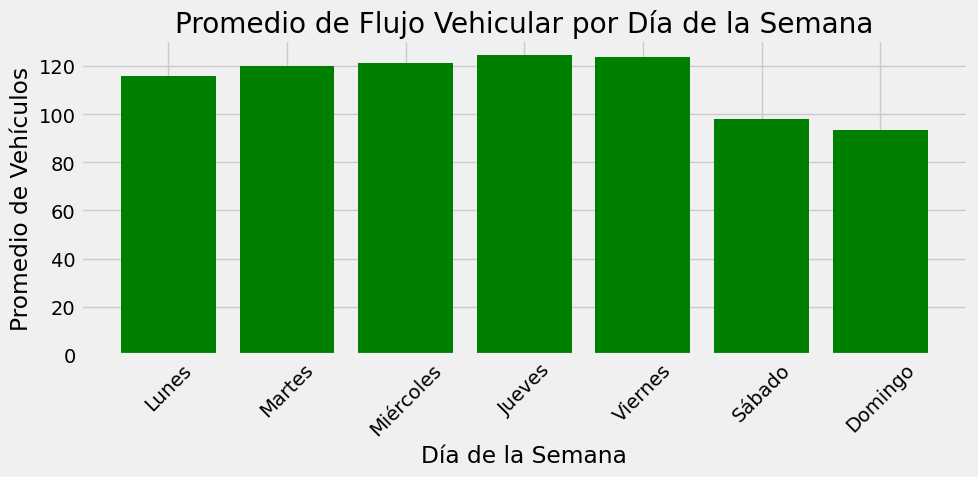

In [186]:
import matplotlib.pyplot as plt
# Gráfico de barras del promedio de flujo vehicular por día de la semana
# ==============================================================================    

# Convertir 'cantidad_pasos' a numérico
datos['cantidad_pasos'] = pd.to_numeric(datos['cantidad_pasos'], errors='coerce')

# Agrupar por día de la semana y calcular el promedio
datos['DIA_SEMANA'] = datos['fecha'].dt.dayofweek  # 0: lunes, ..., 6: domingo
promedio_dia = datos.groupby('DIA_SEMANA')['cantidad_pasos'].mean()

# Nombres de días
dias_semana = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Gráfico de barras
plt.figure(figsize=(10, 5))
plt.bar(dias_semana, promedio_dia, color='green')
plt.title('Promedio de Flujo Vehicular por Día de la Semana')
plt.xlabel('Día de la Semana')
plt.ylabel('Promedio de Vehículos')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [188]:
# Query SQL para extraer datos
_, datos = get_blob_to_df(table_name = 'dbo.vw_FACT_TRAFFIC_FLOW_FORECASTING', connection_str = cnn)

In [189]:
datos

,date_time,hour,period,month,weekday,sentido,tipo_vehiculo,forma_pago,traffic_count,TIPO_CONJUNTO
0,2017-01-01 00:00:00,0,AM,1,6,Centro,Liviano,no cobrado,252,1
1,2017-01-01 00:00:00,0,AM,1,6,Centro,Liviano,efectivo,1,1
2,2017-01-01 00:00:00,0,AM,1,6,Centro,Liviano,telepase,100,1
3,2017-01-01 00:00:00,0,AM,1,6,Centro,Pesado,telepase,2,1
4,2017-01-01 00:00:00,0,AM,1,6,Centro,Pesado,telepase,1,1
...,...,...,...,...,...,...,...,...,...,...
1048570,2020-12-29 10:00:00,10,AM,12,1,Provincia,Pesados 6 Ejes,tag,1,0
1048571,2020-12-29 11:00:00,11,AM,12,1,Centro,Pesados 6 Ejes,tag,2,0
1048572,2020-12-29 12:00:00,12,PM,12,1,Provincia,Pesados 6 Ejes,tag,1,0
1048573,2020-12-29 13:00:00,13,PM,12,1,Centro,Pesados 6 Ejes,tag,1,0


In [192]:
# weekday a objeto
datos['weekday'] = datos['weekday'].astype('object')
datos['hour'] = datos['hour'].astype('object')

In [194]:
# Agrupar los datos por fecha, día de la semana y hora, y sumar el tráfico
# ==============================================================================
datos_grouped_by_datetime = datos.groupby(['date_time', 'weekday', 'hour']).agg({'traffic_count': 'sum'}).reset_index()

In [196]:
# Preprocesamiento de datos
# ==============================================================================
# Convertir las columnas 'fecha' y 'hora_inicio' a objetos date_time
datos_grouped_by_datetime['date_time'] = pd.to_datetime(datos_grouped_by_datetime['date_time'], format='%Y-%m-%d %H:%M:%S')

# Establecer 'date_time' como índice del DataFrame
datos_grouped_by_datetime = datos_grouped_by_datetime.set_index('date_time')

In [198]:
# Ajustar la frecuencia del DataFrame a intervalos horarios
datos_grouped_by_datetime = datos_grouped_by_datetime.asfreq('H')

# Ordenar el DataFrame por el índice (date_time)
datos_grouped_by_datetime = datos_grouped_by_datetime.sort_index()

In [200]:
#  DataFrame resultante
datos_grouped_by_datetime

,weekday,hour,traffic_count
date_time,,,
2017-01-01 00:00:00,6.0,0.0,598.0
2017-01-01 01:00:00,6.0,1.0,2222.0
2017-01-01 02:00:00,6.0,2.0,2632.0
2017-01-01 03:00:00,6.0,3.0,1780.0
2017-01-01 04:00:00,6.0,4.0,794.0
...,...,...,...
2020-12-31 19:00:00,3.0,19.0,2602.0
2020-12-31 20:00:00,3.0,20.0,2830.0
2020-12-31 21:00:00,3.0,21.0,1865.0


In [202]:
# Asignar el DataFrame preprocesado a la variable 'datos'
datos = datos_grouped_by_datetime

In [204]:
# Separación datos train-val-test
# ==============================================================================
fin_train = '2019-06-30 23:59:00'
fin_validacion = '2020-06-30 23:59:00'
datos_train = datos.loc[: fin_train, :]
datos_val   = datos.loc[fin_train:fin_validacion, :]
datos_test  = datos.loc[fin_validacion:, :]

print(f"Fechas train      : {datos_train.index.min()} --- {datos_train.index.max()}  (n={len(datos_train)})")
print(f"Fechas validacion : {datos_val.index.min()} --- {datos_val.index.max()}  (n={len(datos_val)})")
print(f"Fechas test       : {datos_test.index.min()} --- {datos_test.index.max()}  (n={len(datos_test)})")

Fechas train      : 2017-01-01 00:00:00 --- 2019-06-30 23:00:00  (n=21864)
Fechas validacion : 2019-07-01 00:00:00 --- 2020-06-30 23:00:00  (n=8784)
Fechas test       : 2020-07-01 00:00:00 --- 2020-12-31 23:00:00  (n=4416)


In [206]:
print(datos_train['traffic_count'].dtype)
print(datos_val['traffic_count'].dtype)
print(datos_test['traffic_count'].dtype)

float64
float64
float64


In [208]:
# Contar nulos
print(f"Datos train nulos: {datos_train.isnull().sum()}")
print(f"Datos validacion nulos: {datos_val.isnull().sum()}") 
print(f"Datos test nulos: {datos_test.isnull().sum()}")

Datos train nulos: weekday          11
hour             11
traffic_count    11
dtype: int64
Datos validacion nulos: weekday          0
hour             0
traffic_count    0
dtype: int64
Datos test nulos: weekday          0
hour             0
traffic_count    0
dtype: int64


In [210]:
# Mostrar registros con nulos
print("Datos train con nulos:")
print(datos_train[datos_train.isnull().any(axis=1)])
print("Datos validacion con nulos:")
print(datos_val[datos_val.isnull().any(axis=1)])
print("Datos test con nulos:")
print(datos_test[datos_test.isnull().any(axis=1)])

Datos train con nulos:
                     weekday  hour  traffic_count
date_time                                        
2018-11-29 22:00:00      NaN   NaN            NaN
2018-11-29 23:00:00      NaN   NaN            NaN
2018-11-30 00:00:00      NaN   NaN            NaN
2018-11-30 01:00:00      NaN   NaN            NaN
2018-11-30 02:00:00      NaN   NaN            NaN
2018-11-30 03:00:00      NaN   NaN            NaN
2018-11-30 04:00:00      NaN   NaN            NaN
2018-11-30 05:00:00      NaN   NaN            NaN
2018-11-30 06:00:00      NaN   NaN            NaN
2018-12-01 03:00:00      NaN   NaN            NaN
2018-12-30 07:00:00      NaN   NaN            NaN
Datos validacion con nulos:
Empty DataFrame
Columns: [weekday, hour, traffic_count]
Index: []
Datos test con nulos:
Empty DataFrame
Columns: [weekday, hour, traffic_count]
Index: []


In [212]:
# Rellenar nulos en datos_train
datos_train['traffic_count'] = datos_train['traffic_count'].fillna(
    datos_train.groupby([datos_train.index.hour])['traffic_count'].transform('mean')
)

In [214]:
# Rellenar nulos en la columna 'weekday' de datos_train
datos_train['weekday'] = datos_train['weekday'].fillna(
    datos_train.groupby([datos_train.index.hour])['weekday'].transform('mean')
)

In [216]:
# Rellenar nulos en la columna 'weekday' de datos_train
datos_train['hour'] = datos_train['hour'].fillna(
    datos_train.groupby([datos_train.index.hour])['hour'].transform('mean')
)

In [218]:
print(f"Datos train nulos: {datos_train.isnull().sum()}")

Datos train nulos: weekday          0
hour             0
traffic_count    0
dtype: int64


In [220]:
# Gráfico serie temporal
# ==============================================================================
fig, ax = plt.subplots(figsize=(11, 4))
datos_train['traffic_count'].plot(ax=ax, label='entrenamiento')
datos_val['traffic_count'].plot(ax=ax, label='validación')
datos_test['traffic_count'].plot(ax=ax, label='test')
ax.set_title('Número de vehículos')
ax.legend();

In [222]:
# Gráfico serie temporal con zoom
# ==============================================================================
zoom = ('2018-11-20 00:00:00','2018-12-05 00:00:00')

fig = plt.figure(figsize=(11, 6))
grid = plt.GridSpec(nrows=8, ncols=1, hspace=0.6, wspace=0)

main_ax = fig.add_subplot(grid[1:3, :])
zoom_ax = fig.add_subplot(grid[5:, :])

datos_train['traffic_count'].plot(ax=main_ax, label='entrenamiento', alpha=0.5)
datos_val['traffic_count'].plot(ax=main_ax, label='validación', alpha=0.5)
datos_test['traffic_count'].plot(ax=main_ax, label='test', alpha=0.5)
min_y = min(datos['traffic_count'])
max_y = max(datos['traffic_count'])
main_ax.fill_between(zoom, min_y, max_y, facecolor='blue', alpha=0.5, zorder=0)
main_ax.set_xlabel('')
main_ax.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.8))

datos.loc[zoom[0]: zoom[1]]['traffic_count'].plot(ax=zoom_ax, color='blue', linewidth=2)

main_ax.set_title(f'Número de vehículos: {datos.index.min()}, {datos.index.max()}', fontsize=14)
zoom_ax.set_title(f'Número de vehículos: {zoom}', fontsize=14)
plt.subplots_adjust(hspace=1)

In [224]:
# Gráfico interactivo serie temporal
# ==============================================================================
try:
    datos.loc[:fin_train, 'particion'] = 'entrenamiento'
    datos.loc[fin_train:fin_validacion, 'particion'] = 'validación'
    datos.loc[fin_validacion:, 'particion'] = 'test'

    fig = px.line(
        data_frame = datos.reset_index(),
        x = 'date_time',
        y = 'traffic_count',
        color = 'particion',
        title = 'Número de vehículos',
        width = 900,
        height = 500
    )

    fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        )
    )

    # Intento principal con renderizador forzado
    try:
        fig.show(renderer="notebook")
    except:
        # Fallback 1: Browser
        import webbrowser
        fig.write_html("temp_plot.html")
        webbrowser.open("temp_plot.html")
        
        # Fallback 2: IFrame
        from IPython.display import IFrame
        display(IFrame(src="temp_plot.html", width=1000, height=600))

finally:
    # Limpieza
    datos = datos.drop(columns='particion', errors='ignore')

In [225]:
# Gráfico boxplot para estacionalidad diaria
# ==============================================================================
fig, ax = plt.subplots(figsize=(10, 3))
promedio_dia_hora = datos.groupby(["weekday", "hour"])["traffic_count"].mean()
q25_dia_hora = datos.groupby(["weekday", "hour"])["traffic_count"].quantile(0.25)
q75_dia_hora = datos.groupby(["weekday", "hour"])["traffic_count"].quantile(0.75)

promedio_dia_hora.plot(ax=ax, label='promedio')
q25_dia_hora.plot(ax=ax, linestyle='dashed', color='gray', label='')
q75_dia_hora.plot(ax=ax, linestyle='dashed', color='gray', label='cuantil 25 y 75')


ax.set(
    title="Promedio de autos a largo de la semana",
    xticks=[i * 24 for i in range(7)],
    xticklabels=["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    xlabel="Día y hora de la semana",
    ylabel="Número de autos"
)

ax.legend();

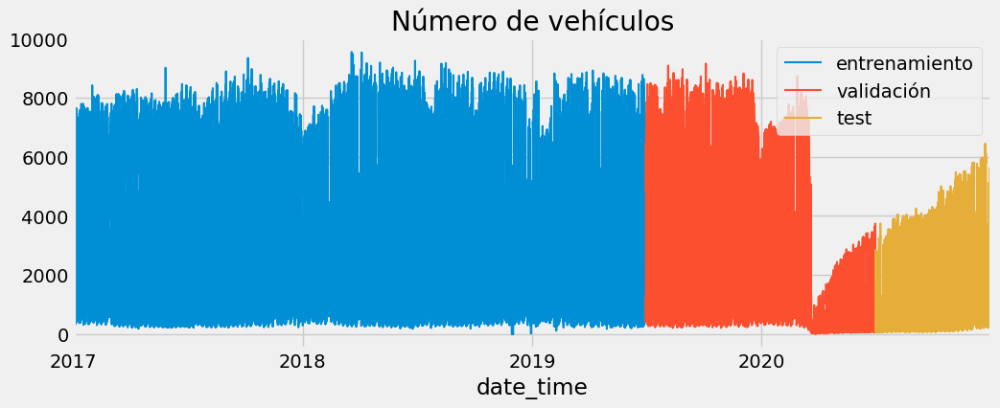

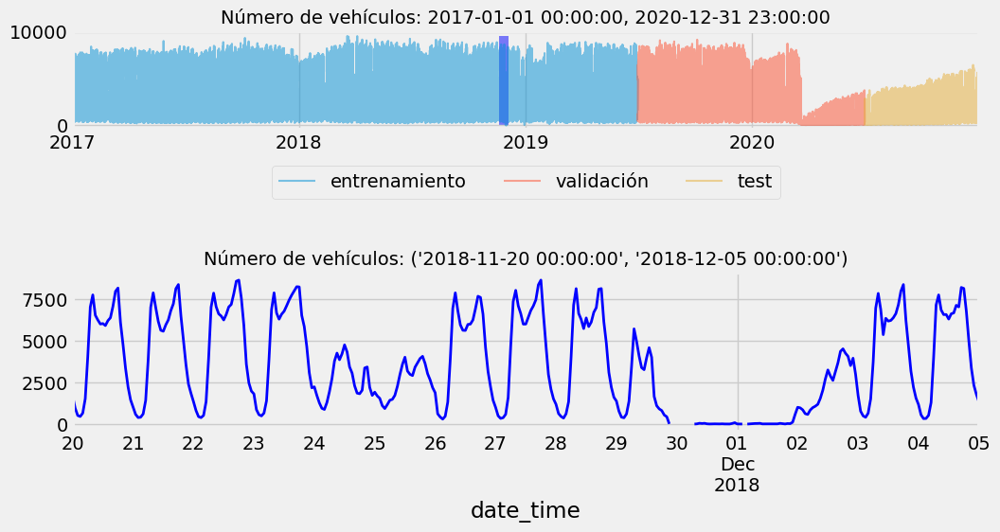

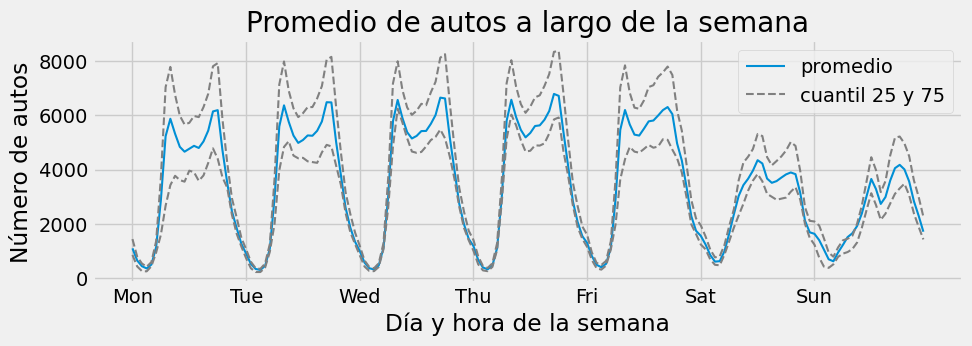

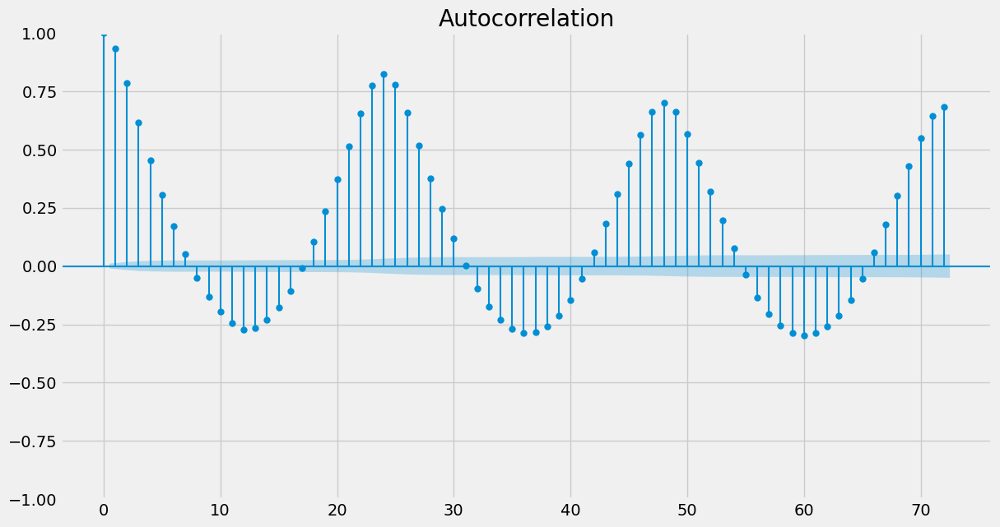

In [226]:
# Gráfico autocorrelación
# ==============================================================================
fig, ax = plt.subplots(figsize=(13, 7))
plot_acf(
  datos['traffic_count'].fillna(
    datos.groupby([datos.index.hour])['traffic_count'].transform('mean')
  )  # Rellenar nulos hacia adelante
  , ax=ax
  , lags=72
  )
#plot_acf(data_a, lags=90)
plt.show()

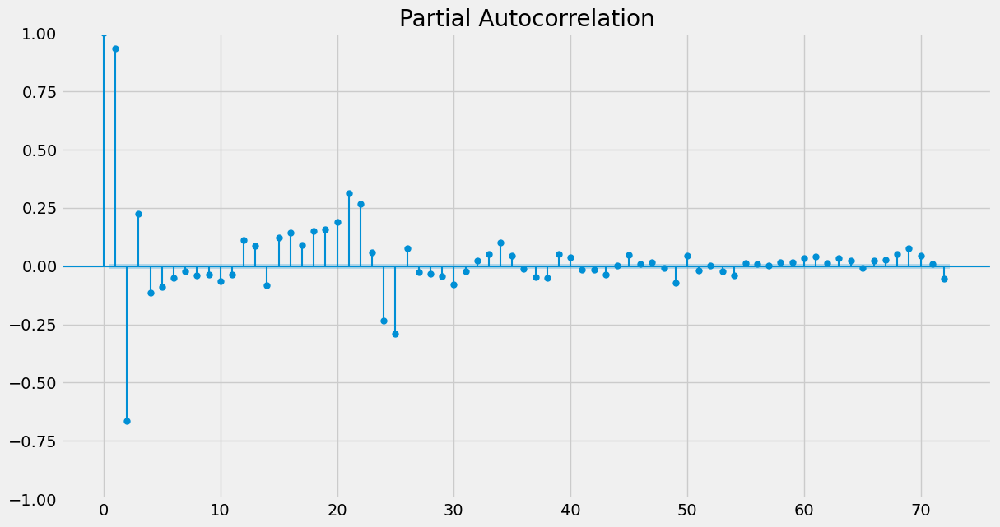

In [229]:
# Gráfico autocorrelación parcial
# ==============================================================================
fig, ax = plt.subplots(figsize=(13, 7))
plot_pacf(
  datos['traffic_count'].fillna(
    datos.groupby([datos.index.hour])['traffic_count'].transform('mean')
  ) 
  , ax=ax, lags=72
  , method='ywm'
)
plt.show()

In [230]:
# Crear forecaster
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24
             )

forecaster

ForecasterAutoreg 
Regressor: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] 
Transformer for y: None 
Transformer for exog: None 
Window size: 24 
Weight function included: False 
Differentiation order: None 
Exogen

In [231]:
# Grid search de hiperparámetros
# Hiperparámetros del regresor
param_grid = {
    'n_estimators': [100, 500],
    'max_depth': [3, 5, 10],
    'learning_rate': [0.01, 0.1]
}

# Rellenar valores nulos con el promedio por hora
datos.loc[:fin_validacion, 'traffic_count'] = datos.loc[:fin_validacion, 'traffic_count'].fillna(
    datos.loc[:fin_validacion, 'traffic_count'].groupby(datos.loc[:fin_validacion].index.hour).transform('mean')
)

In [232]:
# Lags utilizados como predictores
lags_grid = [24, 48, 72, [1, 2, 3, 23, 24, 25, 71, 72, 73]]

# Grid search de hiperparámetros
resultados_grid = grid_search_forecaster(
        forecaster         = forecaster,
        y                  = datos.loc[:fin_validacion, 'traffic_count'], # conjunto de train y validación
        param_grid         = param_grid,
        lags_grid          = lags_grid,
        steps              = 36,
        refit              = False,
        metric             = 'mean_squared_error',
        initial_train_size = int(len(datos_train)), # El modelo se entrena con los datos de entrenamiento
        return_best        = True,
        verbose            = False
)

Number of models compared: 48.


lags grid:   0%|          | 0/4 [00:00<?, ?it/s]

params grid:   0%|          | 0/12 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 1595026.3208495907



In [233]:
# Mostrar resultados del grid search
len(datos.loc[:fin_validacion])

30648

In [234]:
# Backtesting
metric, predicciones = backtesting_forecaster(
    forecaster = forecaster,
    y          = datos['traffic_count'],
    initial_train_size = len(datos.loc[:fin_validacion]),
    steps      = 60,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

print(f"Error de backtest: {metric}")

  0%|          | 0/74 [00:00<?, ?it/s]

Error de backtest:    mean_squared_error
0        1.793159e+06


In [239]:
predicciones

,pred
2020-07-01 00:00:00,198.893967
2020-07-01 01:00:00,183.783417
2020-07-01 02:00:00,197.332901
2020-07-01 03:00:00,215.595230
2020-07-01 04:00:00,291.404602
...,...
2020-12-31 19:00:00,4568.401855
2020-12-31 20:00:00,3420.754639
2020-12-31 21:00:00,2610.554932
2020-12-31 22:00:00,1852.870605


In [244]:
# Guardar predicciones test
# ==============================================================================
def guardar_resultados(datos, modelo):
    fecha_ejecucion = datetime.now()
    resultados = pd.DataFrame({
        'DATE_TIME': datos.index,
        'PREDICCION': datos['pred'],
        'MODELO': modelo,
        'EXECUTION_DATE': fecha_ejecucion
    })
    return resultados

def upload_df_to_blob(df: pd.DataFrame, table_name: str, connection_str: str):
    try:
        df = df.where(pd.notnull(df), None)
        with pyodbc.connect(connection_str, autocommit=True) as conn:
            cursor = conn.cursor()
            columns = ','.join(df.columns)
            cmd_insert = f"INSERT INTO {table_name} ({columns}) VALUES ({','.join(['?'] * len(df.columns))})"
            cursor.fast_executemany = True
            cursor.executemany(cmd_insert, df.values.tolist())
        return True, ""
    except Exception as e:
        return False, str(e)

def guardar_pronostico(datos, modelo):
    # Obtener la fecha de ejecución actual
    fecha_ejecucion = datetime.now()
    
    # Crear un nuevo DataFrame con las columnas requeridas
    resultados = pd.DataFrame({
        'DATE_TIME': datos.index,        # Fecha (index)
        'PREDICCION': datos['pred'],       # Columna pred
        'MODELO': modelo            # Nombre del modelo
    })
    
    return resultados

In [248]:
# Guardar predicciones test
# ==============================================================================
rs1 = guardar_resultados(predicciones, 'MODEL_FORECASTER')
upload_df_to_blob(df = rs1, table_name = 'PREDICCION_TRAFFIC_FLOW', connection_str = cnn)

(True, '')

In [250]:
# Guardar pronóstico
forecaster.fit(y=datos_train['traffic_count'])

In [252]:
# Realizar predicción para los próximos 2160 pasos (90 días con frecuencia horaria)
data1 = forecaster.predict(steps=2160, last_window=datos['traffic_count'])
data1 = pd.DataFrame(data1)
data1

,pred
2021-01-01 00:00:00,464.522827
2021-01-01 01:00:00,713.651184
2021-01-01 02:00:00,824.502319
2021-01-01 03:00:00,1110.163940
2021-01-01 04:00:00,1246.606445
...,...
2021-03-31 19:00:00,824.940308
2021-03-31 20:00:00,747.284180
2021-03-31 21:00:00,704.846619
2021-03-31 22:00:00,660.647217


In [254]:
# Guardar forecasting
rs1 = guardar_pronostico(data1, 'MODEL_FORECASTER')
upload_df_to_blob(df = rs1, table_name = 'FORECASTING_TRAFFIC_FLOW', connection_str = cnn)

(True, '')

In [256]:
# Gráfico estatico predicciones test
fig, ax = plt.subplots(figsize=(11, 4))
datos_test['traffic_count'].plot(ax=ax, label='test')
predicciones['pred'].plot(ax=ax, label='predicciones')
ax.legend();

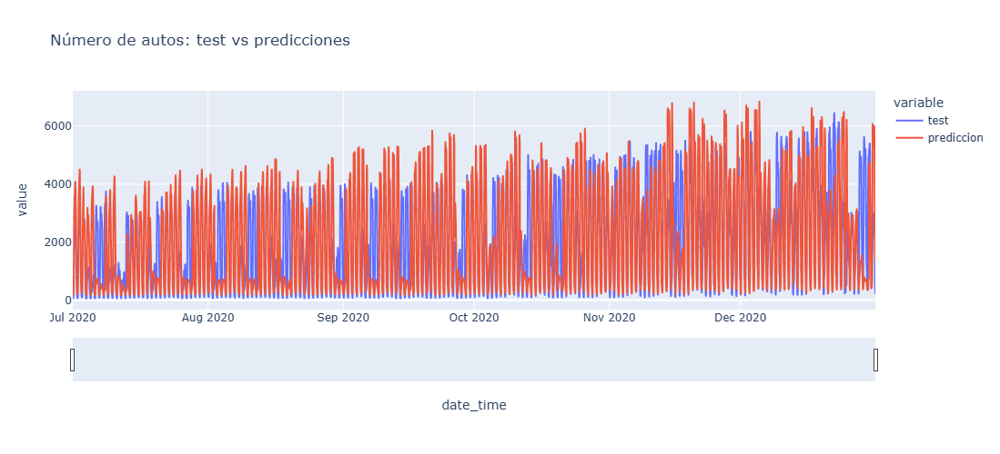

In [258]:
# Gráfico interactivo serie temporal
datos_plot = pd.DataFrame({
                'test': datos_test['traffic_count'],
                'prediccion': predicciones['pred'],

                 })
datos_plot.index.name = 'date_time'

fig = px.line(
    data_frame = datos_plot.reset_index(),
    x      = 'date_time',
    y      = datos_plot.columns,
    title  = 'Número de autos: test vs predicciones',
    width  = 900,
    height = 500
)

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [260]:
# Query SQL para extraer datos
_, datos = get_blob_to_df(table_name = 'dbo.vw_FACT_TRAFFIC_FLOW_FORECASTING', connection_str = cnn)

In [262]:
datos

,date_time,hour,period,month,weekday,sentido,tipo_vehiculo,forma_pago,traffic_count,TIPO_CONJUNTO
0,2017-01-01 00:00:00,0,AM,1,6,Centro,Liviano,no cobrado,252,1
1,2017-01-01 00:00:00,0,AM,1,6,Centro,Liviano,efectivo,1,1
2,2017-01-01 00:00:00,0,AM,1,6,Centro,Liviano,telepase,100,1
3,2017-01-01 00:00:00,0,AM,1,6,Centro,Pesado,telepase,2,1
4,2017-01-01 00:00:00,0,AM,1,6,Centro,Pesado,telepase,1,1
...,...,...,...,...,...,...,...,...,...,...
1048570,2020-12-29 10:00:00,10,AM,12,1,Provincia,Pesados 6 Ejes,tag,1,0
1048571,2020-12-29 11:00:00,11,AM,12,1,Centro,Pesados 6 Ejes,tag,2,0
1048572,2020-12-29 12:00:00,12,PM,12,1,Provincia,Pesados 6 Ejes,tag,1,0
1048573,2020-12-29 13:00:00,13,PM,12,1,Centro,Pesados 6 Ejes,tag,1,0


In [264]:
import numpy as np

# Crear columnas precomputadas de forma vectorizada
for sentido in datos['sentido'].unique():
    datos[f'Sentido_{sentido}'] = np.where(datos['sentido'] == sentido, datos['traffic_count'], 0)

for tipo_vehiculo in datos['tipo_vehiculo'].unique():
    datos[f'TV_{tipo_vehiculo}'] = np.where(datos['tipo_vehiculo'] == tipo_vehiculo, datos['traffic_count'], 0)

for forma_pago in datos['forma_pago'].unique():
    datos[f'Forma_Pago_{forma_pago}'] = np.where(datos['forma_pago'] == forma_pago, datos['traffic_count'], 0)

# Agrupar y sumar
datos_pivot = datos.groupby(['date_time', 'hour', 'weekday', 'month', 'period', 'TIPO_CONJUNTO']).sum()

In [266]:
# Eliminamos columnas originales
datos_pivot = datos_pivot.drop(columns=['sentido', 'tipo_vehiculo', 'forma_pago'])

In [268]:
# Crear columnas de porcentajes de forma vectorizada
for col in [col for col in datos_pivot.columns if col.startswith('Sentido_') or col.startswith('TV_') or col.startswith('Forma_Pago_')]:
    datos_pivot[f'{col}_pct'] = datos_pivot[col] / datos_pivot['traffic_count']

In [270]:
# Resetear el índice para convertirlo en un DataFrame normal
datos_pivot = datos_pivot.reset_index()

In [272]:
datos_pivot

,date_time,hour,weekday,month,period,TIPO_CONJUNTO,traffic_count,Sentido_Centro,Sentido_Provincia,TV_Liviano,...,Forma_Pago_exento_pct,Forma_Pago_tarjeta discapacidad_pct,Forma_Pago_infraccion_pct,Forma_Pago_monedero_pct,Forma_Pago_rec.deuda_pct,Forma_Pago_tarjeta magnÃ©tica_pct,Forma_Pago_tag_pct,Forma_Pago_violaciÃ³n_pct,Forma_Pago_cpp_pct,Forma_Pago_mercado pago_pct
0,2017-01-01 00:00:00,0,6,1,AM,1,598,356,242,594,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
1,2017-01-01 01:00:00,1,6,1,AM,1,2222,1271,951,2201,...,0.003150,0.013951,0.002700,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
2,2017-01-01 02:00:00,2,6,1,AM,1,2632,1537,1095,2609,...,0.001140,0.009878,0.002280,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
3,2017-01-01 03:00:00,3,6,1,AM,1,1780,1074,706,1760,...,0.007303,0.010112,0.001124,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
4,2017-01-01 04:00:00,4,6,1,AM,1,794,442,352,780,...,0.007557,0.008816,0.002519,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35048,2020-12-31 19:00:00,19,3,12,PM,0,2602,1132,1470,0,...,0.001153,0.000000,0.000000,0.0,0.004996,0.003459,0.764796,0.024981,0.0,0.019985
35049,2020-12-31 20:00:00,20,3,12,PM,0,2830,1232,1598,0,...,0.003887,0.000000,0.000000,0.0,0.003534,0.001060,0.776325,0.125442,0.0,0.013781
35050,2020-12-31 21:00:00,21,3,12,PM,0,1865,893,972,0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.747453,0.233780,0.0,0.018767
35051,2020-12-31 22:00:00,22,3,12,PM,0,480,228,252,0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.641667,0.329167,0.0,0.029167


In [274]:
# Index a datetime
datos_pivot['date_time'] = pd.to_datetime(datos_pivot['date_time'], format='%Y-%m-%d %H:%M:%S')

# Establecer 'date_time' como índice del DataFrame
datos_pivot = datos_pivot.set_index('date_time')

# Ajustar la frecuencia del DataFrame a intervalos horarios
datos_pivot = datos_pivot.asfreq('H')

# Ordenar el DataFrame por el índice (date_time)
datos_pivot = datos_pivot.sort_index()
# Mostrar el DataFrame resultante
datos_pivot

,hour,weekday,month,period,TIPO_CONJUNTO,traffic_count,Sentido_Centro,Sentido_Provincia,TV_Liviano,TV_Pesado,...,Forma_Pago_exento_pct,Forma_Pago_tarjeta discapacidad_pct,Forma_Pago_infraccion_pct,Forma_Pago_monedero_pct,Forma_Pago_rec.deuda_pct,Forma_Pago_tarjeta magnÃ©tica_pct,Forma_Pago_tag_pct,Forma_Pago_violaciÃ³n_pct,Forma_Pago_cpp_pct,Forma_Pago_mercado pago_pct
date_time,,,,,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,0.0,6.0,1.0,AM,1.0,598.0,356.0,242.0,594.0,4.0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
2017-01-01 01:00:00,1.0,6.0,1.0,AM,1.0,2222.0,1271.0,951.0,2201.0,21.0,...,0.003150,0.013951,0.002700,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
2017-01-01 02:00:00,2.0,6.0,1.0,AM,1.0,2632.0,1537.0,1095.0,2609.0,23.0,...,0.001140,0.009878,0.002280,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
2017-01-01 03:00:00,3.0,6.0,1.0,AM,1.0,1780.0,1074.0,706.0,1760.0,20.0,...,0.007303,0.010112,0.001124,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
2017-01-01 04:00:00,4.0,6.0,1.0,AM,1.0,794.0,442.0,352.0,780.0,14.0,...,0.007557,0.008816,0.002519,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,19.0,3.0,12.0,PM,0.0,2602.0,1132.0,1470.0,0.0,0.0,...,0.001153,0.000000,0.000000,0.0,0.004996,0.003459,0.764796,0.024981,0.0,0.019985
2020-12-31 20:00:00,20.0,3.0,12.0,PM,0.0,2830.0,1232.0,1598.0,0.0,0.0,...,0.003887,0.000000,0.000000,0.0,0.003534,0.001060,0.776325,0.125442,0.0,0.013781
2020-12-31 21:00:00,21.0,3.0,12.0,PM,0.0,1865.0,893.0,972.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.747453,0.233780,0.0,0.018767


In [276]:
# Rellenar nulos en la columna 'traffic_count' de datos_pivot
datos_pivot['traffic_count'] = datos_pivot['traffic_count'].fillna(
    datos_pivot.groupby([datos_pivot.index.hour])['traffic_count'].transform('mean')
)

In [278]:
# Rellenar nulos en la columna 'weekday' de datos_pivot
datos_pivot['weekday'] = datos_pivot['weekday'].fillna(
    datos_pivot.groupby([datos_pivot.index.hour])['weekday'].transform('mean')
)

In [280]:
# Rellenar nulos en la columna 'hour' de datos_pivot
datos_pivot['hour'] = datos_pivot['hour'].fillna(
    datos_pivot.groupby([datos_pivot.index.hour])['hour'].transform('mean')
)

In [282]:
datos = datos_pivot

In [284]:
# Cambio de las variables categóricas a tipo category
# ==============================================================================
datos['period'] = datos['period'].astype('category')
datos['month']   = datos['month'].astype('category')
datos['weekday'] = datos['weekday'].astype('category')

In [286]:
# Transformación seno-coseno de la variable hora
# ==============================================================================
datos['hour_sin'] = np.sin(datos['hour'] / 23 * 2 * np.pi)
datos['hour_cos'] = np.cos(datos['hour'] / 23 * 2 * np.pi)

# Representación de la transformación seno-coseno de la variable hora
# ==============================================================================
fig, ax = plt.subplots(figsize=(4, 4))
sp = ax.scatter(datos["hour_sin"], datos["hour_cos"], c=datos["hour"])
ax.set(
    xlabel="sin(hour)",
    ylabel="cos(hour)",
)
_ = fig.colorbar(sp)

datos = datos.drop(columns='hour')

In [288]:
# One hot encoding
# ==============================================================================
datos = pd.get_dummies(datos, columns=['period', 'month', 'weekday'])
datos.head(3)

,TIPO_CONJUNTO,traffic_count,Sentido_Centro,Sentido_Provincia,TV_Liviano,TV_Pesado,TV_Auto,TV_Auto con trailer,TV_Moto,TV_N/D,...,weekday_1.0,weekday_2.0,weekday_2.9958875942426317,weekday_2.995890410958904,weekday_2.9972602739726026,weekday_2.997945205479452,weekday_3.0,weekday_4.0,weekday_5.0,weekday_6.0
date_time,,,,,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,1.0,598.0,356.0,242.0,594.0,4.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,True
2017-01-01 01:00:00,1.0,2222.0,1271.0,951.0,2201.0,21.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,True
2017-01-01 02:00:00,1.0,2632.0,1537.0,1095.0,2609.0,23.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,True


In [290]:
# Se seleccionan todas las variables exógenas, incluidas las obtenidas al hacer
# el one hot encoding.
variables_exogenas = [column for column in datos.columns
                      if column.startswith(('period', 'month', 'hour', 'weekday'))]
print(variables_exogenas)

['hour_sin', 'hour_cos', 'period_AM', 'period_PM', 'month_1.0', 'month_2.0', 'month_3.0', 'month_4.0', 'month_5.0', 'month_6.0', 'month_7.0', 'month_8.0', 'month_9.0', 'month_10.0', 'month_11.0', 'month_12.0', 'weekday_0.0', 'weekday_1.0', 'weekday_2.0', 'weekday_2.9958875942426317', 'weekday_2.995890410958904', 'weekday_2.9972602739726026', 'weekday_2.997945205479452', 'weekday_3.0', 'weekday_4.0', 'weekday_5.0', 'weekday_6.0']


In [292]:
# Como los datos han sido modificados, se repite el reparto en train, val y test.
fin_train = '2019-06-30 23:59:00'
fin_validacion = '2020-06-30 23:59:00'
datos_train = datos.loc[: fin_train, :]
datos_val   = datos.loc[fin_train:fin_validacion, :]
datos_test  = datos.loc[fin_validacion:, :]

print(f"Fechas train      : {datos_train.index.min()} --- {datos_train.index.max()}  (n={len(datos_train)})")
print(f"Fechas validacion : {datos_val.index.min()} --- {datos_val.index.max()}  (n={len(datos_val)})")
print(f"Fechas test       : {datos_test.index.min()} --- {datos_test.index.max()}  (n={len(datos_test)})")

Fechas train      : 2017-01-01 00:00:00 --- 2019-06-30 23:00:00  (n=21864)
Fechas validacion : 2019-07-01 00:00:00 --- 2020-06-30 23:00:00  (n=8784)
Fechas test       : 2020-07-01 00:00:00 --- 2020-12-31 23:00:00  (n=4416)


In [294]:
# Crear forecaster
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24
             )

In [296]:
# Grid search de hiperparámetros
# Hiperparámetros del regresor
param_grid = {
    'n_estimators': [100, 500],
    'max_depth': [3, 5, 10],
    'learning_rate': [0.01, 0.1]
}

# Lags utilizados como predictores
lags_grid = [72, [1, 2, 3, 23, 24, 25, 71, 72, 73]]

resultados_grid = grid_search_forecaster(
                        forecaster         = forecaster,
                        y                  = datos.loc[:fin_validacion, 'traffic_count'],
                        exog               = datos.loc[:fin_validacion, variables_exogenas],
                        param_grid         = param_grid,
                        lags_grid          = lags_grid,
                        steps              = 36,
                        refit              = False,
                        metric             = 'mean_squared_error',
                        initial_train_size = int(len(datos_train)),
                        return_best        = True,
                        verbose            = False
                   )

Number of models compared: 24.


lags grid:   0%|          | 0/2 [00:00<?, ?it/s]

params grid:   0%|          | 0/12 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 1498588.4474351641



In [297]:
# Backtesting
# ==============================================================================
metric, predicciones = backtesting_forecaster(
    forecaster         = forecaster,
    y                  = datos['traffic_count'],
    exog               = datos[variables_exogenas],
    initial_train_size = len(datos.loc[:fin_validacion]),
    steps              = 36,
    refit              = False,
    metric             = 'mean_squared_error',
    verbose            = False
)

print(f"Error de backtest: {metric}")

  0%|          | 0/123 [00:00<?, ?it/s]

Error de backtest:    mean_squared_error
0       996939.040791


In [298]:
predicciones

,pred
2020-07-01 00:00:00,212.584183
2020-07-01 01:00:00,116.366089
2020-07-01 02:00:00,81.879150
2020-07-01 03:00:00,71.170914
2020-07-01 04:00:00,169.091171
...,...
2020-12-31 19:00:00,5100.970215
2020-12-31 20:00:00,3751.077637
2020-12-31 21:00:00,2616.370361
2020-12-31 22:00:00,1974.841309


In [302]:
# Guardar predicciones test
rs1 = guardar_resultados(predicciones, 'MODEL_EXOGENEAS')
upload_df_to_blob(df = rs1, table_name = 'PREDICCION_TRAFFIC_FLOW', connection_str = cnn)

(True, '')

In [303]:
# Gráfico estatico predicciones test
# ==============================================================================
fig, ax = plt.subplots(figsize=(11, 4))
datos_test['traffic_count'].plot(ax=ax, label='test')
predicciones['pred'].plot(ax=ax, label='predicciones')
ax.legend();

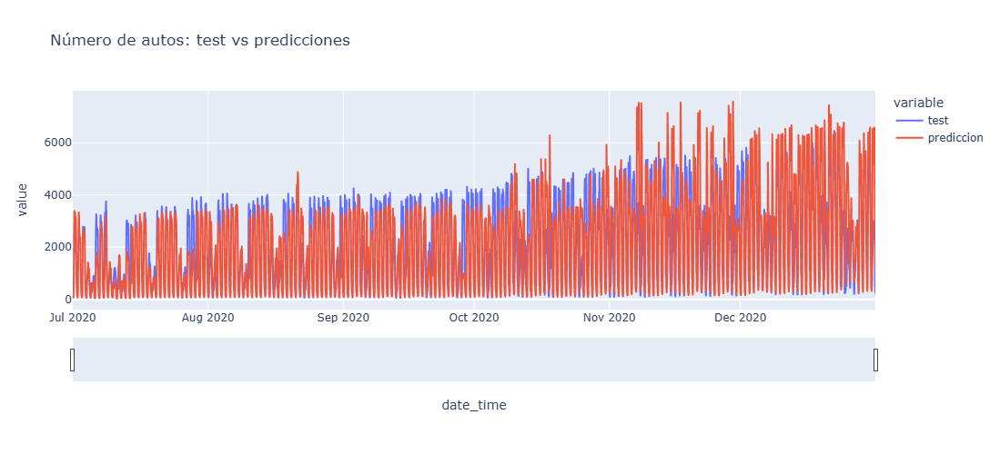

In [304]:
# Gráfico interactivo serie temporal
# ==============================================================================
datos_plot = pd.DataFrame({
                'test': datos_test['traffic_count'],
                'prediccion': predicciones['pred'],

                 })
datos_plot.index.name = 'date_time'

fig = px.line(
    data_frame = datos_plot.reset_index(),
    x      = 'date_time',
    y      = datos_plot.columns,
    title  = 'Número de autos: test vs predicciones',
    width  = 900,
    height = 500
)

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [308]:
# Importancia predictores
# ==============================================================================
importancia = forecaster.regressor.get_booster().get_score(importance_type='weight')
importancia

{'lag_1': 5728.0,
 'lag_2': 2498.0,
 'lag_3': 1528.0,
 'lag_4': 1268.0,
 'lag_5': 1055.0,
 'lag_6': 883.0,
 'lag_7': 768.0,
 'lag_8': 790.0,
 'lag_9': 697.0,
 'lag_10': 648.0,
 'lag_11': 633.0,
 'lag_12': 614.0,
 'lag_13': 598.0,
 'lag_14': 502.0,
 'lag_15': 513.0,
 'lag_16': 511.0,
 'lag_17': 442.0,
 'lag_18': 445.0,
 'lag_19': 523.0,
 'lag_20': 487.0,
 'lag_21': 549.0,
 'lag_22': 482.0,
 'lag_23': 641.0,
 'lag_24': 778.0,
 'lag_25': 571.0,
 'lag_26': 511.0,
 'lag_27': 421.0,
 'lag_28': 405.0,
 'lag_29': 422.0,
 'lag_30': 402.0,
 'lag_31': 379.0,
 'lag_32': 376.0,
 'lag_33': 366.0,
 'lag_34': 330.0,
 'lag_35': 342.0,
 'lag_36': 331.0,
 'lag_37': 317.0,
 'lag_38': 289.0,
 'lag_39': 321.0,
 'lag_40': 341.0,
 'lag_41': 307.0,
 'lag_42': 317.0,
 'lag_43': 323.0,
 'lag_44': 352.0,
 'lag_45': 354.0,
 'lag_46': 348.0,
 'lag_47': 353.0,
 'lag_48': 418.0,
 'lag_49': 390.0,
 'lag_50': 387.0,
 'lag_51': 376.0,
 'lag_52': 339.0,
 'lag_53': 320.0,
 'lag_54': 369.0,
 'lag_55': 318.0,
 'lag_56': 357

In [310]:
# Convertir la importancia a un DataFrame
last_window = datos['traffic_count'][-forecaster.window_size:]

# Asegurarse de que las variables exógenas estén alineadas temporalmente
exog_future = datos[variables_exogenas].iloc[-2160:]
exog_future.index = pd.date_range(
    start=last_window.index[-1] + pd.Timedelta(hours=1),  # Comienza justo después de last_window
    periods=2160,
    freq='H'  # Ajusta la frecuencia según tus datos (por ejemplo, 'H' para horas)
)

predicciones = forecaster.predict(
    steps=2160,
    last_window=last_window,
    exog=exog_future
)
predicciones = pd.DataFrame(predicciones)
predicciones

,pred
2021-01-01 00:00:00,372.003296
2021-01-01 01:00:00,1444.942505
2021-01-01 02:00:00,1564.977783
2021-01-01 03:00:00,1506.792236
2021-01-01 04:00:00,1202.577515
...,...
2021-03-31 19:00:00,6935.454102
2021-03-31 20:00:00,5676.529785
2021-03-31 21:00:00,4059.371094
2021-03-31 22:00:00,2787.021973


In [312]:
# Save forecasting
# ==============================================================================
rs1 = guardar_pronostico(predicciones, 'MODEL_EXOGENEAS')
upload_df_to_blob(df = rs1, table_name = 'FORECASTING_TRAFFIC_FLOW', connection_str = cnn)

(True, '')

In [314]:
# Crear forecaster
forecaster = ForecasterAutoreg(
                regressor = LGBMRegressor(random_state=123, device='gpu'),
                lags = 24
             )

forecaster

ForecasterAutoreg 
Regressor: LGBMRegressor(device='gpu', random_state=123) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] 
Transformer for y: None 
Transformer for exog: None 
Window size: 24 
Weight function included: False 
Differentiation order: None 
Exogenous included: False 
Exogenous variables names: None 
Training range: None 
Training index type: None 
Training index frequency: None 
Regressor parameters: {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': -1, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': 123, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0, 'device': 'gpu'} 
fit_kwargs: {} 
Creation date: 2025-07-06 19:34:46 
Last fit date: None 
Skforecast version: 0.13.0 
Python versio

In [316]:
print(datos[variables_exogenas].dtypes)

hour_sin                      float64
hour_cos                      float64
period_AM                        bool
period_PM                        bool
month_1.0                        bool
month_2.0                        bool
month_3.0                        bool
month_4.0                        bool
month_5.0                        bool
month_6.0                        bool
month_7.0                        bool
month_8.0                        bool
month_9.0                        bool
month_10.0                       bool
month_11.0                       bool
month_12.0                       bool
weekday_0.0                      bool
weekday_1.0                      bool
weekday_2.0                      bool
weekday_2.9958875942426317       bool
weekday_2.995890410958904        bool
weekday_2.9972602739726026       bool
weekday_2.997945205479452        bool
weekday_3.0                      bool
weekday_4.0                      bool
weekday_5.0                      bool
weekday_6.0 

In [318]:
# Para variables categóricas (one-hot encoded)
datos[variables_exogenas] = datos[variables_exogenas].astype(float)

# O si son categóricas no numéricas:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in datos[variables_exogenas].select_dtypes(include=['object']).columns:
    datos[col] = le.fit_transform(datos[col].astype(str))

In [320]:
# Grid search de hiperparámetros
param_grid = {
    'n_estimators': [100, 500],
    'max_depth': [3, 5, 10],
    'learning_rate': [0.01, 0.1]
}

lags_grid = [24, 48, 72, [1, 2, 3, 23, 24, 25, 71, 72, 73]]

resultados_grid = grid_search_forecaster(
                        forecaster         = forecaster,
                        y                  = datos.loc[:fin_validacion, 'traffic_count'],
                        exog               = datos.loc[:fin_validacion, variables_exogenas],
                        param_grid         = param_grid,
                        lags_grid          = lags_grid,
                        steps              = 36,
                        refit              = False,
                        metric             = 'mean_squared_error',
                        initial_train_size = int(len(datos_train)),
                        return_best        = True,
                        verbose            = False
                   )

Number of models compared: 48.


lags grid:   0%|          | 0/4 [00:00<?, ?it/s]

params grid:   0%|          | 0/12 [00:00<?, ?it/s]

[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 6206
[LightGBM] [Info] Number of data points in the train set: 21840, number of used features: 47
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3050 Ti Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 29 dense feature groups (0.67 MB) transferred to GPU in 0.002862 secs. 0 sparse feature groups
[LightGBM] [Info] Start training from score 3876.805411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

In [321]:
# Resultados Grid Search
# ==============================================================================
resultados_grid.head(10)

,lags,lags_label,params,mean_squared_error,learning_rate,max_depth,n_estimators
18,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",1.460530e+06,0.10,3.0,100.0
37,"[1, 2, 3, 23, 24, 25, 71, 72, 73]","[1, 2, 3, 23, 24, 25, 71, 72, 73]","{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",1.583542e+06,0.01,3.0,500.0
19,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",1.597604e+06,0.10,3.0,500.0
9,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",1.759835e+06,0.10,5.0,500.0
10,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",1.781185e+06,0.10,10.0,100.0
31,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",1.810694e+06,0.10,3.0,500.0
30,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",1.829332e+06,0.10,3.0,100.0
6,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",1.867609e+06,0.10,3.0,100.0
34,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",1.873144e+06,0.10,10.0,100.0
7,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",1.891917e+06,0.10,3.0,500.0


In [324]:
# Backtesting
metric, predicciones = backtesting_forecaster(
    forecaster         = forecaster,
    y                  = datos['traffic_count'],
    exog               = datos[variables_exogenas],
    initial_train_size = len(datos.loc[:fin_validacion]),
    steps              = 36,
    refit              = False,
    metric             = 'mean_squared_error',
    verbose            = False
)

print(f"Error de backtest: {metric}")

[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 12326
[LightGBM] [Info] Number of data points in the train set: 30600, number of used features: 71
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3050 Ti Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 53 dense feature groups (1.63 MB) transferred to GPU in 0.005218 secs. 0 sparse feature groups
[LightGBM] [Info] Start training from score 3632.580365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

  0%|          | 0/123 [00:00<?, ?it/s]

Error de backtest:    mean_squared_error
0        2.219318e+06


In [326]:
# Gráfico estatico predicciones test
# ==============================================================================
fig, ax = plt.subplots(figsize=(11, 4))
datos_test['traffic_count'].plot(ax=ax, label='test')
predicciones['pred'].plot(ax=ax, label='predicciones')
ax.legend();

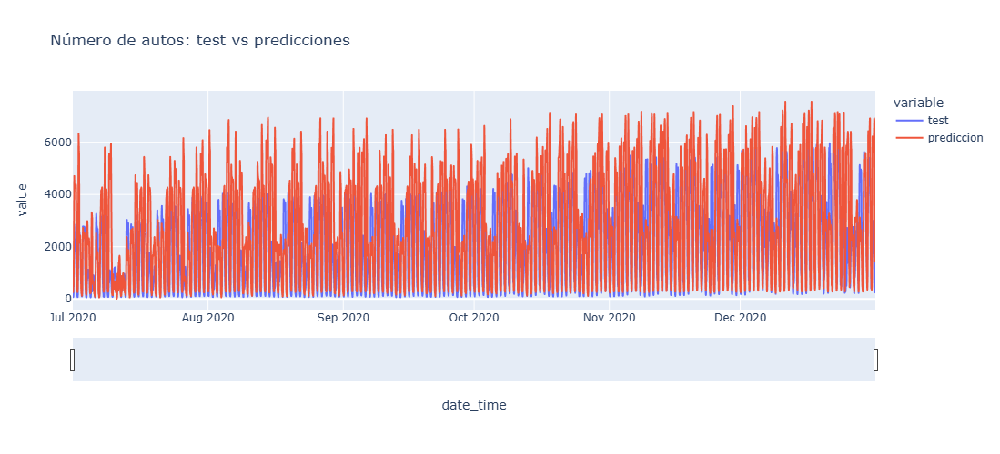

In [328]:
# Gráfico interactivo serie temporal
# ==============================================================================
datos_plot = pd.DataFrame({
                'test': datos_test['traffic_count'],
                'prediccion': predicciones['pred'],

                 })
datos_plot.index.name = 'date_time'

fig = px.line(
    data_frame = datos_plot.reset_index(),
    x      = 'date_time',
    y      = datos_plot.columns,
    title  = 'Número de autos: test vs predicciones',
    width  = 900,
    height = 500
)

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [330]:
# Save predicciones test
# ==============================================================================
rs1 = guardar_resultados(predicciones, 'MODEL_EXOGENEAS_LGBM')
upload_df_to_blob(df = rs1, table_name = 'PREDICCION_TRAFFIC_FLOW', connection_str = cnn)

(True, '')

In [331]:
# Importancia predictores
# ==============================================================================
importancia = forecaster.regressor.feature_importances_
importancia

array([171,  28,  24,  32,  22,  11,   7,   7,   8,  11,  12,   7,  22,
         6,   4,   2,   0,   8,  17,   8,   3,   2,   9,  25,  14,   5,
         0,   1,   4,   6,   8,   4,   1,   9,   2,  12,   2,   3,   3,
         4,   3,   0,   4,   2,   6,   2,   6,   1,  63,  46,   0,   0,
         1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   6,
         0,   0,   0,   0,   0,   0,   2,  17,   7,   2])

In [334]:
last_window = datos['traffic_count'][-forecaster.window_size:]

# Asegurarse de que las variables exógenas estén alineadas temporalmente
exog_future = datos[variables_exogenas].iloc[-2160:]
exog_future.index = pd.date_range(
    start=last_window.index[-1] + pd.Timedelta(hours=1),  # Comienza justo después de last_window
    periods=2160,
    freq='H'  # Ajusta la frecuencia según tus datos (por ejemplo, 'H' para horas)
)

predicciones = forecaster.predict(
    steps=2160,
    last_window=last_window,
    exog=exog_future
)
predicciones = pd.DataFrame(predicciones)
predicciones

,pred
2021-01-01 00:00:00,248.435228
2021-01-01 01:00:00,466.555533
2021-01-01 02:00:00,680.642898
2021-01-01 03:00:00,1073.147899
2021-01-01 04:00:00,1410.561994
...,...
2021-03-31 19:00:00,5858.170847
2021-03-31 20:00:00,4483.637394
2021-03-31 21:00:00,3150.422666
2021-03-31 22:00:00,2268.110481


In [336]:
# Save forecasting
# ==============================================================================
rs1 = guardar_pronostico(predicciones, 'MODEL_EXOGENEAS_LGBM')
upload_df_to_blob(df = rs1, table_name = 'FORECASTING_TRAFFIC_FLOW', connection_str = cnn)

(True, '')

In [338]:
# Crear forecaster
# ==============================================================================
forecaster = ForecasterAutoreg(
                regressor = CatBoostRegressor(random_state=123, silent=True, task_type='GPU'),
                lags = 24
             )

forecaster

ForecasterAutoreg 
Regressor: <catboost.core.CatBoostRegressor object at 0x0000014298D17B00> 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] 
Transformer for y: None 
Transformer for exog: None 
Window size: 24 
Weight function included: False 
Differentiation order: None 
Exogenous included: False 
Exogenous variables names: None 
Training range: None 
Training index type: None 
Training index frequency: None 
Regressor parameters: {'loss_function': 'RMSE', 'silent': True, 'task_type': 'GPU', 'random_state': 123} 
fit_kwargs: {} 
Creation date: 2025-07-06 19:42:03 
Last fit date: None 
Skforecast version: 0.13.0 
Python version: 3.12.7 
Forecaster id: None 

In [340]:
# Grid search de hiperparámetros
# ==============================================================================
# Hiperparámetros del regresor
from catboost import CatBoostRegressor

 

param_grid = {
    'n_estimators': [100, 500],
    'max_depth': [3, 5, 10],
    'learning_rate': [0.01, 0.1]
}

# Lags utilizados como predictores
lags_grid = [72, [1, 2, 3, 23, 24, 25, 71, 72, 73]]

resultados_grid = grid_search_forecaster(
                        forecaster         = forecaster,
                        y                  = datos.loc[:fin_validacion, 'traffic_count'],
                        exog               = datos.loc[:fin_validacion, variables_exogenas],
                        param_grid         = param_grid,
                        lags_grid          = lags_grid,
                        steps              = 36,
                        refit              = False,
                        metric             = 'mean_squared_error',
                        initial_train_size = int(len(datos_train)),
                        return_best        = True,
                        verbose            = False
                   )

Number of models compared: 24.


lags grid:   0%|          | 0/2 [00:00<?, ?it/s]

params grid:   0%|          | 0/12 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 1678941.6103049247



In [342]:
# Resultados Grid Search
# ==============================================================================
resultados_grid.head(10)

,lags,lags_label,params,mean_squared_error,learning_rate,max_depth,n_estimators
3,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",1.678942e+06,0.01,5.0,500.0
5,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.01, 'max_depth': 10, 'n_es...",1.817603e+06,0.01,10.0,500.0
9,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",1.927655e+06,0.10,5.0,500.0
8,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",1.952818e+06,0.10,5.0,100.0
1,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",2.137268e+06,0.01,3.0,500.0
7,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",2.159201e+06,0.10,3.0,500.0
13,"[1, 2, 3, 23, 24, 25, 71, 72, 73]","[1, 2, 3, 23, 24, 25, 71, 72, 73]","{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",2.323227e+06,0.01,3.0,500.0
10,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",2.324109e+06,0.10,10.0,100.0
6,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",2.344453e+06,0.10,3.0,100.0
11,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",2.370988e+06,0.10,10.0,500.0


In [344]:
# Backtesting
# ==============================================================================
metric, predicciones = backtesting_forecaster(
    forecaster         = forecaster,
    y                  = datos['traffic_count'],
    exog               = datos[variables_exogenas],
    initial_train_size = len(datos.loc[:fin_validacion]),
    steps              = 36,
    refit              = False,
    metric             = 'mean_squared_error',
    verbose            = False
)

print(f"Error de backtest: {metric}")

  0%|          | 0/123 [00:00<?, ?it/s]

Error de backtest:    mean_squared_error
0        1.967407e+06


In [345]:
# Gráfico estatico predicciones test
# ==============================================================================
fig, ax = plt.subplots(figsize=(11, 4))
datos_test['traffic_count'].plot(ax=ax, label='test')
predicciones['pred'].plot(ax=ax, label='predicciones')
ax.legend();

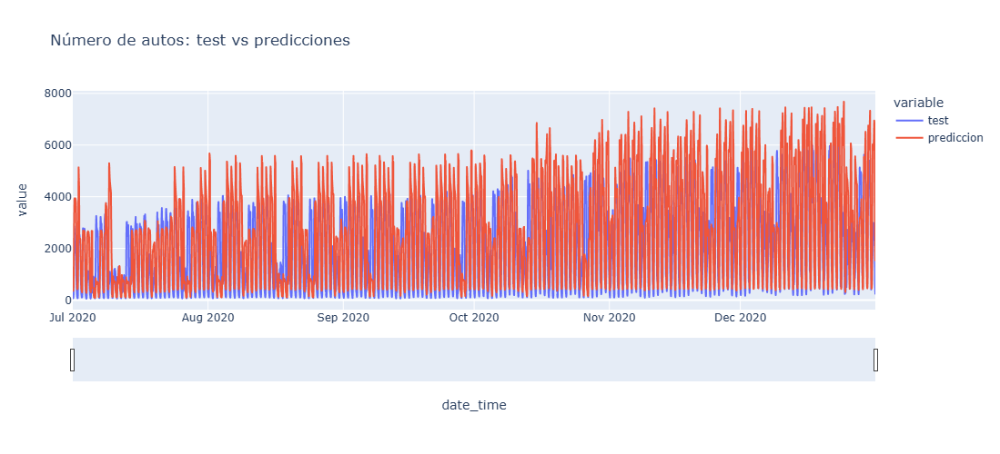

In [346]:
# Gráfico interactivo serie temporal
# ==============================================================================
datos_plot = pd.DataFrame({
                'test': datos_test['traffic_count'],
                'prediccion': predicciones['pred'],

                 })
datos_plot.index.name = 'date_time'

fig = px.line(
    data_frame = datos_plot.reset_index(),
    x      = 'date_time',
    y      = datos_plot.columns,
    title  = 'Número de autos: test vs predicciones',
    width  = 900,
    height = 500
)

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [350]:
# Save predicciones test
# ==============================================================================
rs1 = guardar_resultados(predicciones, 'MODEL_EXOGENEAS_CatBoost')
upload_df_to_blob(df = rs1, table_name = 'PREDICCION_TRAFFIC_FLOW', connection_str = cnn)

(True, '')

In [352]:
last_window = datos['traffic_count'][-forecaster.window_size:]

# Asegurarse de que las variables exógenas estén alineadas temporalmente
exog_future = datos[variables_exogenas].iloc[-2160:]
exog_future.index = pd.date_range(
    start=last_window.index[-1] + pd.Timedelta(hours=1),  # Comienza justo después de last_window
    periods=2160,
    freq='H'  # Ajusta la frecuencia según tus datos (por ejemplo, 'H' para horas)
)

predicciones = forecaster.predict(
    steps=2160,
    last_window=last_window,
    exog=exog_future
)
predicciones = pd.DataFrame(predicciones)
predicciones

,pred
2021-01-01 00:00:00,476.341918
2021-01-01 01:00:00,389.954490
2021-01-01 02:00:00,301.137868
2021-01-01 03:00:00,328.530836
2021-01-01 04:00:00,427.159094
...,...
2021-03-31 19:00:00,6363.911161
2021-03-31 20:00:00,5009.110322
2021-03-31 21:00:00,3627.445506
2021-03-31 22:00:00,2786.542235


In [354]:
# Save forecasting
# ==============================================================================
rs1 = guardar_pronostico(predicciones, 'MODEL_EXOGENEAS_CatBoost')
upload_df_to_blob(df = rs1, table_name = 'FORECASTING_TRAFFIC_FLOW', connection_str = cnn)

(True, '')

In [359]:
pip install keras

Note: you may need to restart the kernel to use updated packages.


In [365]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler

In [367]:
# Convertir los datos a numpy array
train_data = datos_train['traffic_count'].values.reshape(-1, 1)
val_data = datos_val['traffic_count'].values.reshape(-1, 1)
test_data = datos_test['traffic_count'].values.reshape(-1, 1)

# Escalar los datos entre 0 y 1
scaler = MinMaxScaler(feature_range=(0, 1))
train_data_scaled = scaler.fit_transform(train_data)
val_data_scaled = scaler.transform(val_data)
test_data_scaled = scaler.transform(test_data)

In [369]:
# Función para crear secuencias temporales
def create_sequences(data, time_steps):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:(i + time_steps), 0])
        y.append(data[i + time_steps, 0])
    return np.array(X), np.array(y)

# Definir el número de pasos temporales
time_steps = 24

In [371]:
# Crear secuencias temporales para entrenamiento, validación y prueba
X_train, y_train = create_sequences(train_data_scaled, time_steps)
X_val, y_val = create_sequences(val_data_scaled, time_steps)
X_test, y_test = create_sequences(test_data_scaled, time_steps)

# Reshape de los datos para que sean aceptados por la red LSTM
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_val = np.reshape(X_val, (X_val.shape[0], X_val.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [373]:
# Definir el modelo LSTM
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(LSTM(units=50))
model.add(Dense(units=1))

# Compilar el modelo
model.compile(optimizer='adam', loss='mean_squared_error')

# Entrenar el modelo
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0405 - val_loss: 0.0043
Epoch 2/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0037 - val_loss: 0.0029
Epoch 3/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 4/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 5/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - loss: 0.0022 - val_loss: 0.0024
Epoch 6/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - loss: 0.0021 - val_loss: 0.0024
Epoch 7/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - loss: 0.0020 - val_loss: 0.0025
Epoch 8/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - loss: 0.0018 - val_loss: 0.0026
Epoch 9/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - loss: 0.0018 - val_loss: 0.0027
Epoch 10/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - loss: 0.0018 - val_loss: 0.0026
Epoch 11/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - loss: 0.0017 - val_loss: 0.0023
Epoch 12/50
683/683 ━━━━━━━━━━━━━━━━━━━━ 7s 1

In [374]:
# Evaluar el modelo en el conjunto de prueba
loss = model.evaluate(X_test, y_test)
print("Loss en el conjunto de prueba:", loss)

138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0013
Loss en el conjunto de prueba: 0.0014800768112763762


In [375]:
# Predecir en el conjunto de prueba
predictions = model.predict(X_test)

138/138 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


In [376]:
# Desescalar las predicciones
predictions_descaled = scaler.inverse_transform(predictions)

# Mostrar algunas predicciones
for i in range(5):
    print("Predicción:", predictions_descaled[i][0])

Predicción: 98.01475
Predicción: 126.448074
Predicción: -211.05984
Predicción: 347.09427
Predicción: 328.9778


In [381]:
# Crear un DataFrame con las fechas y las predicciones del modelo LSTM
predicciones_df = pd.DataFrame(index=datos_test.index[time_steps:], columns=['pred'])
predicciones_df['pred'] = predictions_descaled
predicciones_df

,pred
date_time,
2020-07-02 00:00:00,98.014748
2020-07-02 01:00:00,126.448074
2020-07-02 02:00:00,-211.059845
2020-07-02 03:00:00,347.094269
2020-07-02 04:00:00,328.977814
...,...
2020-12-31 19:00:00,2785.947754
2020-12-31 20:00:00,2484.243896
2020-12-31 21:00:00,2296.991943


In [383]:
# Gráfico estatico predicciones test
# ==============================================================================
fig, ax = plt.subplots(figsize=(11, 4))
datos_test['traffic_count'].plot(ax=ax, label='test')
predicciones_df['pred'].plot(ax=ax, label='predicciones')
ax.legend();

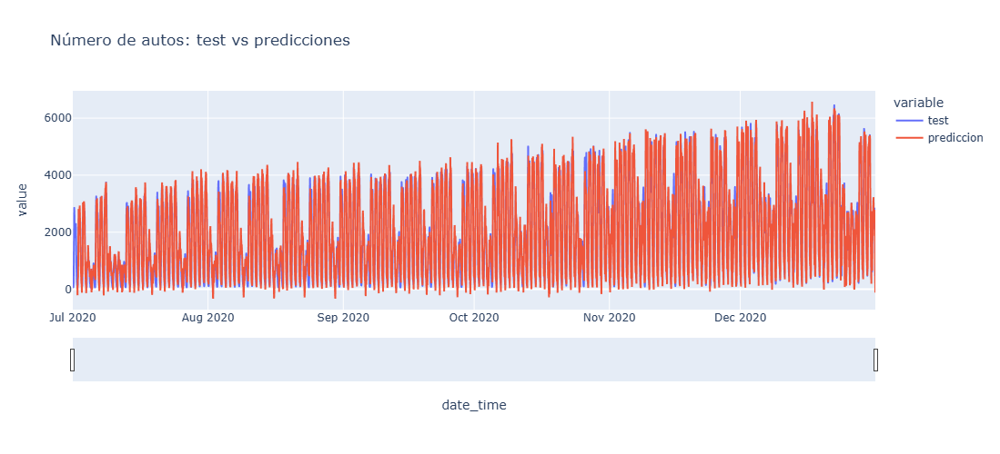

In [385]:
# Gráfico interactivo serie temporal
# ==============================================================================
datos_plot = pd.DataFrame({
                'test': datos_test['traffic_count'],
                'prediccion': predicciones_df['pred'],

                 })
datos_plot.index.name = 'date_time'

fig = px.line(
    data_frame = datos_plot.reset_index(),
    x      = 'date_time',
    y      = datos_plot.columns,
    title  = 'Número de autos: test vs predicciones',
    width  = 900,
    height = 500
)

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [386]:
# Save predicciones test
# ==============================================================================
rs1 = guardar_resultados(predicciones_df, 'MODEL_EXOGENEAS_LSTM')
upload_df_to_blob(df = rs1, table_name = 'PREDICCION_TRAFFIC_FLOW', connection_str = cnn)

(True, '')

In [ ]:
from datetime import timedelta
# Crear un rango de fechas futuro
start_date = pd.to_datetime('2021-01-01 00:00:00')
future_dates = [start_date + timedelta(hours=i) for i in range(90 * 24)]

# Utilizar los últimos datos conocidos para iniciar las predicciones
last_known_data = test_data_scaled[-time_steps:]

# Almacenar predicciones
future_predictions = []

for i in range(len(future_dates)):
    # Preparar el input para el modelo LSTM
    input_data = last_known_data.reshape((1, time_steps, 1))
    
    # Realizar la predicción
    prediction = model.predict(input_data)
    
    # Desescalar la predicción
    prediction_descaled = scaler.inverse_transform(prediction)
    
    # Almacenar la predicción
    future_predictions.append(prediction_descaled[0, 0])
    
    # Actualizar last_known_data para incluir la nueva predicción
    last_known_data = np.append(last_known_data[1:], prediction, axis=0)

# Crear un DataFrame con las fechas y las predicciones
future_predictions_df = pd.DataFrame(data=future_predictions, index=future_dates, columns=['pred'])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

In [390]:
# Mostrar las primeras predicciones futuras
future_predictions_df

,pred
2021-01-01 00:00:00,539.764221
2021-01-01 01:00:00,1519.676636
2021-01-01 02:00:00,2695.729248
2021-01-01 03:00:00,3829.341064
2021-01-01 04:00:00,4613.940918
...,...
2021-03-31 19:00:00,606.448853
2021-03-31 20:00:00,363.522552
2021-03-31 21:00:00,460.704834
2021-03-31 22:00:00,1065.516235


In [394]:
predicciones_df

,pred
date_time,
2020-07-02 00:00:00,98.014748
2020-07-02 01:00:00,126.448074
2020-07-02 02:00:00,-211.059845
2020-07-02 03:00:00,347.094269
2020-07-02 04:00:00,328.977814
...,...
2020-12-31 19:00:00,2785.947754
2020-12-31 20:00:00,2484.243896
2020-12-31 21:00:00,2296.991943


In [396]:
# Save forecasting
# ==============================================================================
rs1 = guardar_pronostico(future_predictions_df, 'MODEL_EXOGENEAS_LSTM')
upload_df_to_blob(df = rs1, table_name = 'FORECASTING_TRAFFIC_FLOW', connection_str = cnn)

(True, '')